In [ ]:
!nvidia-smi

Fri Dec 18 22:27:11 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch
import torch.nn as nn
from torch.nn import functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
from IPython.display import Image, display
import matplotlib.pyplot as plt

# create directory to save results
!mkdir results

# script parameters
batch_size = 128
log_interval = 100

# run on GPU if possible
cuda = torch.cuda.is_available()
device = torch.device("cuda" if cuda else "cpu")

# create data loaders
kwargs = {'num_workers': 1, 'pin_memory': True} if cuda else {}
train_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True,
                   transform=transforms.ToTensor()),
    batch_size=batch_size, shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=False, transform=transforms.ToTensor()),
    batch_size=batch_size, shuffle=True, **kwargs)

Extracting ../data/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/raw


Extracting ../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/raw



Extracting ../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/raw


Extracting ../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
data_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True,
                   transform=transforms.ToTensor()),
    batch_size=64, shuffle=True, **kwargs)

In [ ]:
dataiter = iter(data_loader)
images, labels = dataiter.next()

print(images.shape)
print(labels.shape)

torch.Size([64, 1, 28, 28])
torch.Size([64])


In [ ]:
save_image(images, './real_images.png')

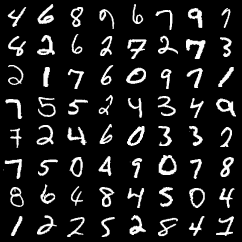

In [ ]:
display(Image('./real_images.png'))

In [ ]:
# Generator Network
class Generator(nn.Module):

    # declare layers
    def __init__(self):
        super(Generator, self).__init__()

        self.fc1 = nn.Linear(20, 400)
        self.fc2 = nn.Linear(400, 784)

    # Forward: one ReLU hidden layer of 400 nodes, one Sigmoid output layer of 784 nodes
    def forward(self, z):
        h = F.relu(self.fc1(z))
        probabilities = F.sigmoid(self.fc2(h))
        return probabilities

# Discriminator Network
class Discriminator(nn.Module):

    # declare layers
    def __init__(self):
        super(Discriminator, self).__init__()

        self.fc1 = nn.Linear(784, 400)
        self.fc2 = nn.Linear(400, 1)

    # Forward: one ReLU hidden layer of 400 nodes, one Sigmoid output layer of 1 node
    def forward(self, x):
        h = F.relu(self.fc1(x))
        probabilities = F.sigmoid(self.fc2(h))
        return probabilities

In [ ]:
def gan_loss_function(predictions, targets):
    BCE = F.binary_cross_entropy(predictions, targets.view(targets.size(0), 1), reduction='sum')
    return BCE

In [ ]:
real_label = 1
fake_label = 0

def gan_train(epoch, generator, generator_optimizer, discriminator, discriminator_optimizer):
    generator_loss = 0.0
    discriminator_loss = 0.0
    generator.train()
    discriminator.train()
    for i, (data, _) in enumerate(train_loader):
        for k in range(1):
            # Update discriminator network
            discriminator.zero_grad()
            # Train all-real batch
            real_data = data.to(device)
            batch_size = real_data.size(0)
            label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            output = discriminator(real_data.view(-1, 784))
            # Calulate loss on all-real batch
            errD_real = gan_loss_function(output, label)
            errD_real.backward()
            # Train all-fake batch
            noise = torch.randn(batch_size, 20, device=device)
            fake_data = generator(noise)
            label.fill_(fake_label)
            output = discriminator(fake_data.detach())
            # Calulate loss on all-fake batch
            errD_fake = gan_loss_function(output, label)
            errD_fake.backward()
            # Calulate total loss on real and fake batch
            errD = errD_real + errD_fake
            discriminator_loss += errD.item()
            discriminator_optimizer.step()
        
        # Update generator network
        generator.zero_grad()
        label.fill_(real_label)
        output = discriminator(fake_data)
        errG = gan_loss_function(output, label)
        errG.backward()
        generator_loss += errG.item()
        generator_optimizer.step()
        
    average_discriminator_loss = discriminator_loss / len(train_loader.dataset)
    average_generator_loss = generator_loss / len(train_loader.dataset)
    return average_generator_loss, average_discriminator_loss

In [ ]:
def gan_test(epoch, generator, discriminator):
    generator.eval()
    discriminator.eval()
    generator_loss = 0.0
    discriminator_loss = 0.0
    with torch.no_grad():
        for i, (data, _) in enumerate(test_loader):
            # Compute dicriminator loss
            # loss in all-real data
            real_data = data.to(device)
            batch_size = real_data.size(0)
            label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            output = discriminator(real_data.view(-1, 784))
            errD_real = gan_loss_function(output, label)
            # loss in all-fake data
            noise = torch.randn(batch_size, 20, device=device)
            fake_data = generator(noise)
            label.fill_(fake_label)
            output = discriminator(fake_data)
            errD_fake = gan_loss_function(output, label)
            errD = errD_real + errD_fake
            discriminator_loss += errD.item()
            # Compute generator loss
            label.fill_(real_label)
            errG = gan_loss_function(output, label)
            generator_loss += errG.item()
            
    average_discriminator_loss = discriminator_loss / len(test_loader.dataset)
    average_generator_loss = generator_loss / len(test_loader.dataset)
    return average_generator_loss, average_discriminator_loss

In [ ]:
import torch
import numpy as np
import torch.nn as nn
import math
from torch.optim import Optimizer
from google.colab import files

In [ ]:
version_higher = (torch.__version__ >= "1.5.0")

class MAdam(Optimizer):
    def __init__(self, params, lr=1e-03, betas=(0.9, 0.999, 0.9), eps=1e-16,
                 weight_decay=0, amsgrad=False, weight_decouple=True, rectify=True, 
                 degenerated_to_sgd=True, fixed_decay=False):
        if not 0.0 <= lr:
            raise ValueError("Invalid learning rate: {}".format(lr))
        if not 0.0 <= eps:
            raise ValueError("Invalid epsilon value: {}".format(eps))
        if not 0.0 <= betas[0] < 1.0:
            raise ValueError("Invalid beta parameter at index 0: {}".format(betas[0]))
        if not 0.0 <= betas[1] < 1.0:
            raise ValueError("Invalid beta parameter at index 1: {}".format(betas[1]))
        if not 0.0 <= weight_decay:
            raise ValueError("Invalid weight_decay value: {}".format(weight_decay))

        if isinstance(params, (list, tuple)) and len(params) > 0 and isinstance(params[0], dict):
            for param in params:
                if 'betas' in param and (param['betas'][0] != betas[0] or param['betas'][1] != betas[1]):
                    param['buffer'] = [[None, None, None] for _ in range(10)]

        defaults = dict(lr=lr, betas=betas, eps=eps,
                        weight_decay=weight_decay, amsgrad=amsgrad, buffer=[[None, None, None] for _ in range(10)])
        super(MAdam, self).__init__(params, defaults)

        self.weight_decouple = weight_decouple
        self.rectify = rectify
        self.degenerated_to_sgd = degenerated_to_sgd
        self.fixed_decay = fixed_decay

    def __setstate__(self, state):
        super(MAdam, self).__setstate__(state)
        for group in self.param_groups:
            group.setdefault('amsgrad', False)

    def step(self, closure=None):
        """Performs a single optimization step.
        Arguments:
            closure (callable, optional): A closure that reevaluates the model
                and returns the loss.
        """
        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None:
                    continue

                grad = p.grad.data
                if grad.is_sparse:
                    raise RuntimeError(
                        'NAdam does not support sparse gradients, please consider SparseAdam instead')
                amsgrad = group['amsgrad']

                state = self.state[p]

                beta1, beta2, beta3 = group['betas']

                # State initialization
                if len(state) == 0:
                    state['step'] = 0
                    # Exponential moving average of gradient values
                    state['exp_avg'] = torch.zeros_like(p.data, memory_format=torch.preserve_format) \
                        if version_higher else torch.zeros_like(p.data)
                    # Exponential moving average of squared gradient values
                    state['exp_avg_var'] = torch.zeros_like(p.data, memory_format=torch.preserve_format) \
                        if version_higher else torch.zeros_like(p.data)

                    if amsgrad:
                        # Maintains max of all exp. moving avg. of sq. grad. values
                        state['max_exp_avg_var'] = torch.zeros_like(p.data, memory_format=torch.preserve_format) \
                            if version_higher else torch.zeros_like(p.data)

                # get current state variable
                exp_avg, exp_avg_var = state['exp_avg'], state['exp_avg_var']

                state['step'] += 1
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']
                
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_diff = (grad - exp_avg) / beta1
                grad.mul_(beta3).add_(grad_diff, alpha=1- beta3)
                exp_avg_var.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)


                if amsgrad:
                    max_exp_avg_var = state['max_exp_avg_var']
                    # Maintains the maximum of all 2nd moment running avg. till now
                    torch.max(max_exp_avg_var, exp_avg_var, out=max_exp_avg_var)

                    # Use the max. for normalizing running avg. of gradient
                    denom = (max_exp_avg_var.sqrt() / math.sqrt(bias_correction2)).add_(group['eps'])

                else:
                    denom = (exp_avg_var.sqrt() / math.sqrt(bias_correction2)).add_(group['eps'])

                # perform weight decay, check if decoupled weight decay
                if self.weight_decouple:
                    if not self.fixed_decay:
                        p.data.mul_(1.0 - group['lr'] * group['weight_decay'])
                    else:
                        p.data.mul_(1.0 - group['weight_decay'])
                else:
                    if group['weight_decay'] != 0:
                        grad.add_(p.data, alpha=group['weight_decay'])

                # Update
                if not self.rectify:
                    # Default update
                    step_size = group['lr'] / bias_correction1
                    p.data.addcdiv_(exp_avg, denom, value=-step_size)

                else:  # Rectified update, forked from RAdam
                    buffered = group['buffer'][int(state['step'] % 10)]
                    if state['step'] == buffered[0]:
                        N_sma, step_size = buffered[1], buffered[2]
                    else:
                        buffered[0] = state['step']
                        beta2_t = beta2 ** state['step']
                        N_sma_max = 2 / (1 - beta2) - 1
                        N_sma = N_sma_max - 2 * state['step'] * beta2_t / (1 - beta2_t)
                        buffered[1] = N_sma

                        # more conservative since it's an approximated value
                        if N_sma >= 5:
                            step_size = math.sqrt(
                                (1 - beta2_t) * (N_sma - 4) / (N_sma_max - 4) * (N_sma - 2) / N_sma * N_sma_max / (
                                        N_sma_max - 2)) / (1 - beta1 ** state['step'])
                        elif self.degenerated_to_sgd:
                            step_size = 1.0 / (1 - beta1 ** state['step'])
                        else:
                            step_size = -1
                        buffered[2] = step_size

                    if N_sma >= 5:
                        denom = exp_avg_var.sqrt().add_(group['eps'])
                        p.data.addcdiv_(exp_avg, denom, value=-step_size * group['lr'])
                    elif step_size > 0:
                        p.data.add_(exp_avg, alpha=-step_size * group['lr'])

        return loss

In [ ]:
import torch.optim as optim

In [ ]:
pip install torch_optimizer

     |████████████████████████████████| 71kB 6.7MB/s 


In [ ]:
from google.colab import files

files.download('./results/final_madam_sample.png')
files.download('madam_gan_g_small_lr_test.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


1/50 Sample of generated images


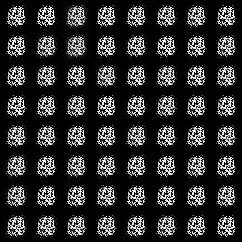



2/50 Sample of generated images


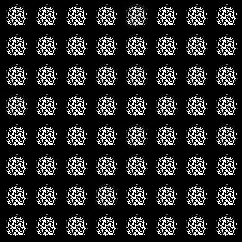



3/50 Sample of generated images


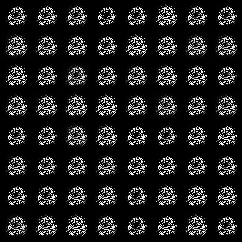



4/50 Sample of generated images


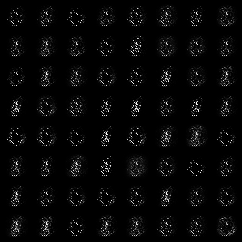



5/50 Sample of generated images


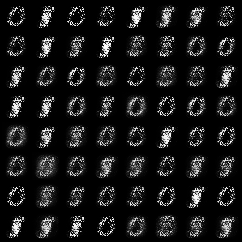



6/50 Sample of generated images


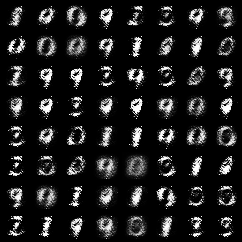



7/50 Sample of generated images


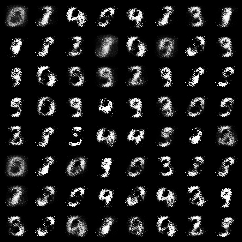



8/50 Sample of generated images


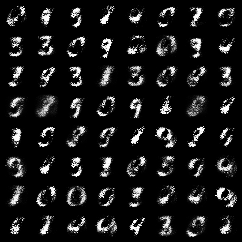



9/50 Sample of generated images


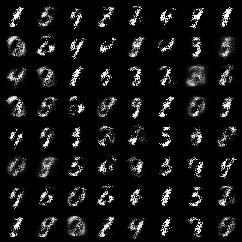



10/50 Sample of generated images


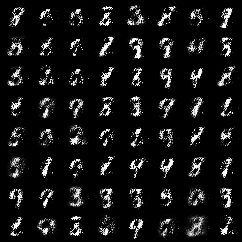



11/50 Sample of generated images


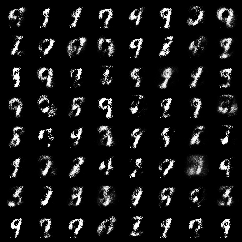



12/50 Sample of generated images


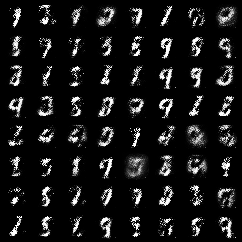



13/50 Sample of generated images


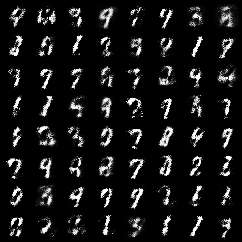



14/50 Sample of generated images


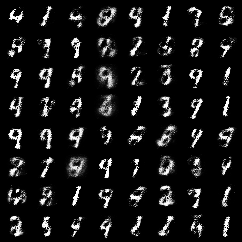



15/50 Sample of generated images


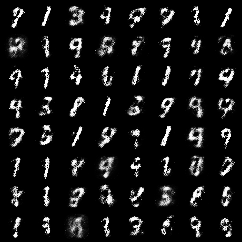



16/50 Sample of generated images


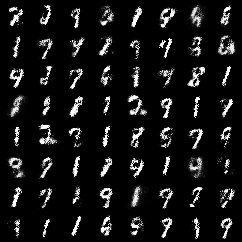



17/50 Sample of generated images


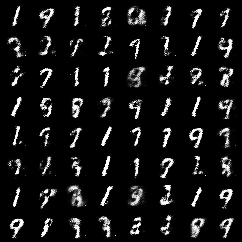



18/50 Sample of generated images


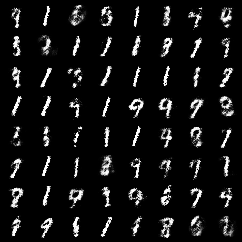



19/50 Sample of generated images


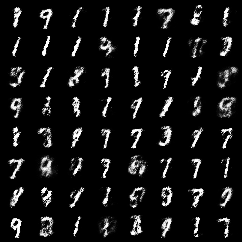



20/50 Sample of generated images


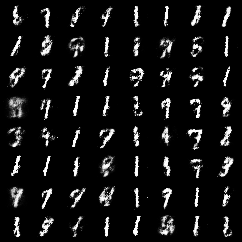



21/50 Sample of generated images


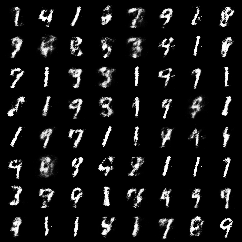



22/50 Sample of generated images


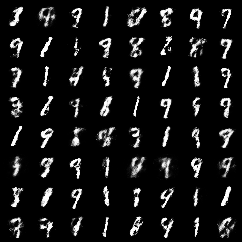



23/50 Sample of generated images


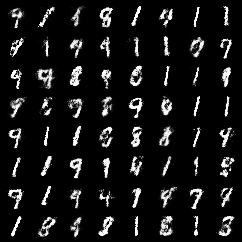



24/50 Sample of generated images


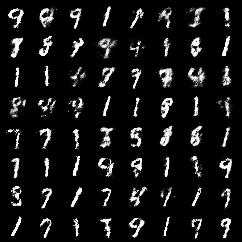



25/50 Sample of generated images


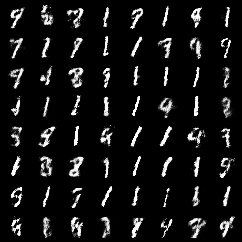



26/50 Sample of generated images


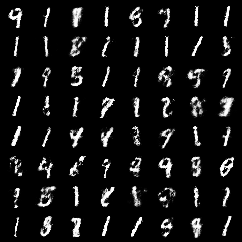



27/50 Sample of generated images


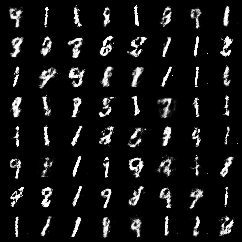



28/50 Sample of generated images


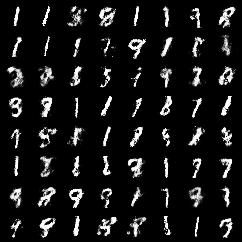



29/50 Sample of generated images


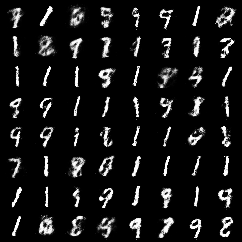



30/50 Sample of generated images


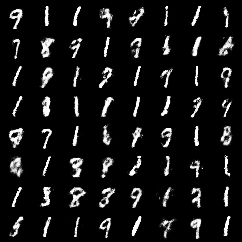



31/50 Sample of generated images


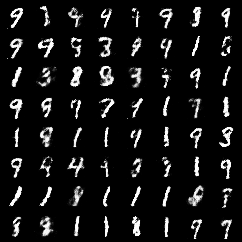



32/50 Sample of generated images


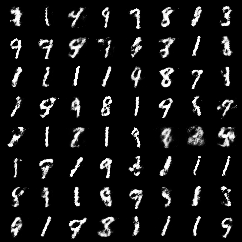



33/50 Sample of generated images


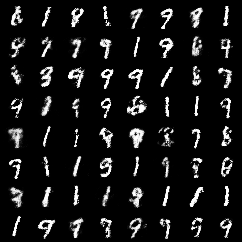



34/50 Sample of generated images


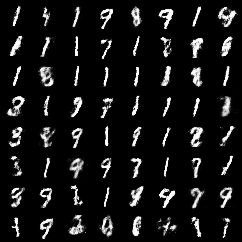



35/50 Sample of generated images


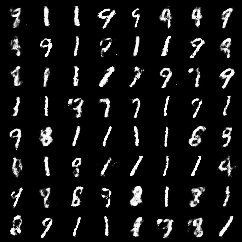



36/50 Sample of generated images


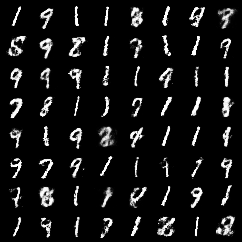



37/50 Sample of generated images


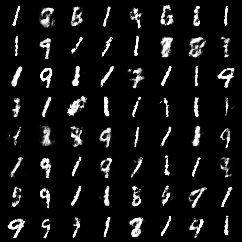



38/50 Sample of generated images


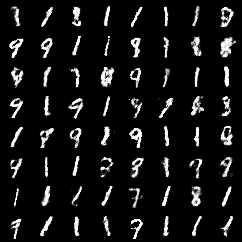



39/50 Sample of generated images


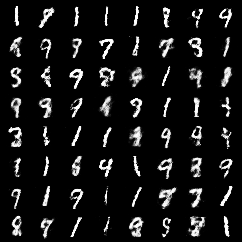



40/50 Sample of generated images


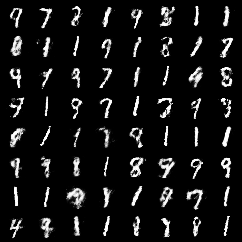



41/50 Sample of generated images


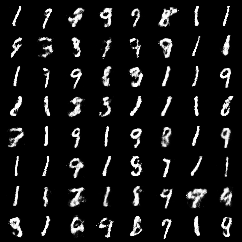



42/50 Sample of generated images


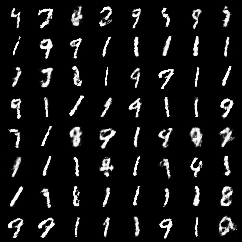



43/50 Sample of generated images


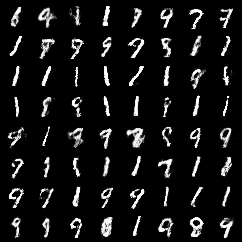



44/50 Sample of generated images


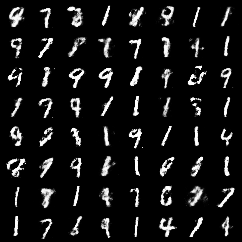



45/50 Sample of generated images


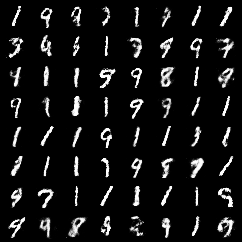



46/50 Sample of generated images


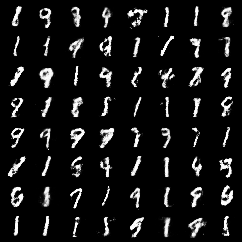



47/50 Sample of generated images


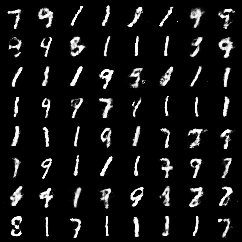



48/50 Sample of generated images


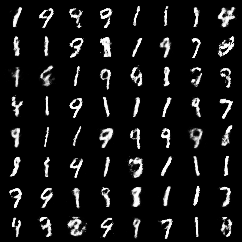



49/50 Sample of generated images


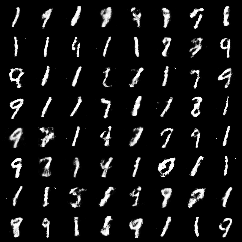



50/50 Sample of generated images


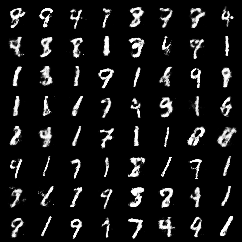

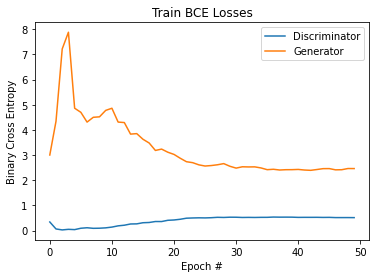

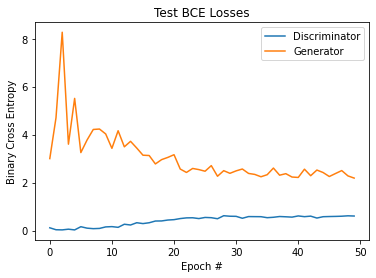

In [ ]:
epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = MAdam(generator_model.parameters(), lr=5e-4, betas=(0.9, 0.999, 0.9))
discriminator_model = Discriminator().to(device)
discriminator_optimizer = MAdam(discriminator_model.parameters(), lr=5e-4, betas=(0.9, 0.999, 0.9))
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        print('%d/%d Sample of generated images' % (epoch, epochs))
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        if epoch == epochs:
            save_image(sample.view(64, 1, 28, 28),
                       'results/final_sgd_sample.png')
            display(Image('results/final_sgd_sample.png'))
        else:
            save_image(sample.view(64, 1, 28, 28),
                    'results/sample_' + str(epoch) + '.png')
            display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

torch.save(generator_average_test_losses, 'sgd_gan_g_xlarge_lr.pt')

In [ ]:
files.download('./results/final_sgd_sample.png')
files.download('sgd_gan_g_xlarge_lr.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files

files.download('./results/final_radam_sample.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


1/50 Sample of generated images


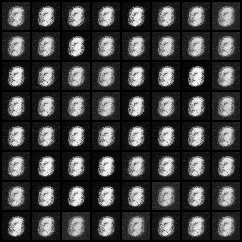



2/50 Sample of generated images


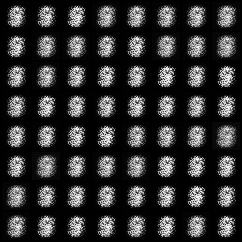



3/50 Sample of generated images


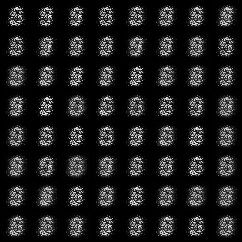



4/50 Sample of generated images


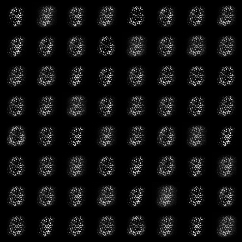



5/50 Sample of generated images


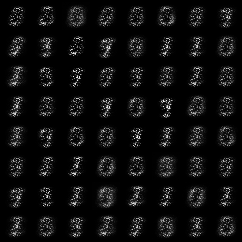



6/50 Sample of generated images


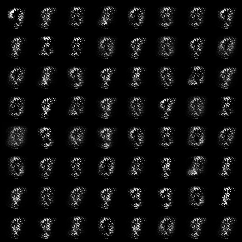



7/50 Sample of generated images


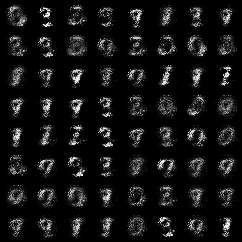



8/50 Sample of generated images


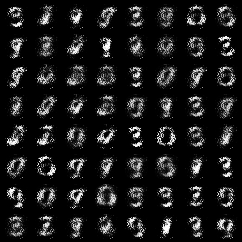



9/50 Sample of generated images


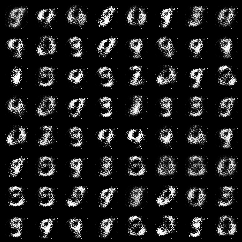



10/50 Sample of generated images


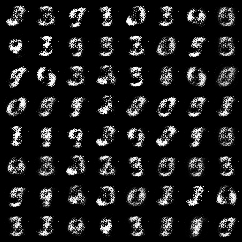



11/50 Sample of generated images


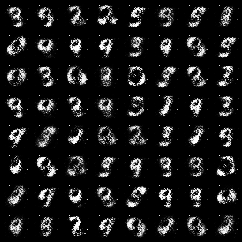



12/50 Sample of generated images


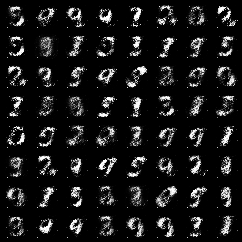



13/50 Sample of generated images


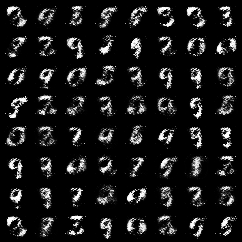



14/50 Sample of generated images


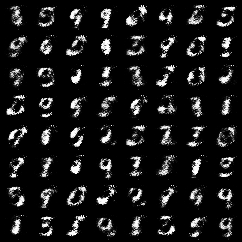



15/50 Sample of generated images


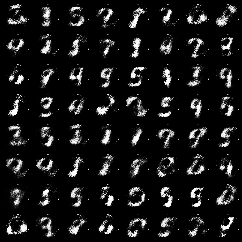



16/50 Sample of generated images


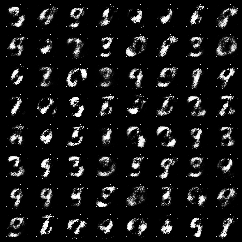



17/50 Sample of generated images


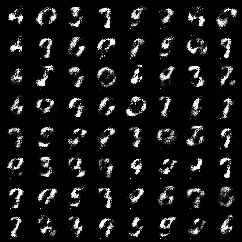



18/50 Sample of generated images


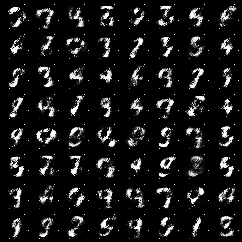



19/50 Sample of generated images


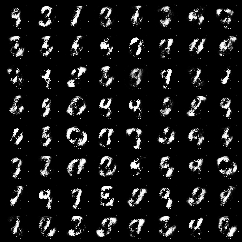



20/50 Sample of generated images


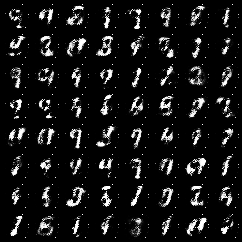



21/50 Sample of generated images


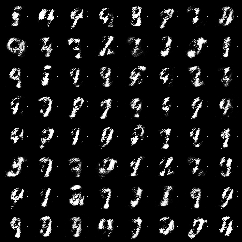



22/50 Sample of generated images


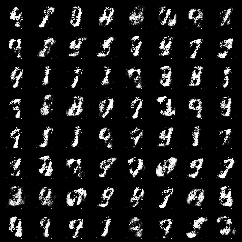



23/50 Sample of generated images


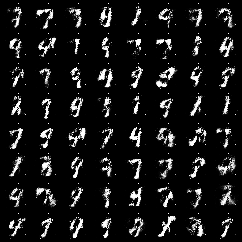



24/50 Sample of generated images


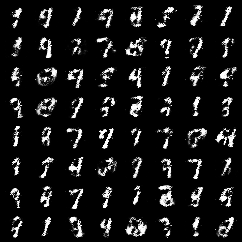



25/50 Sample of generated images


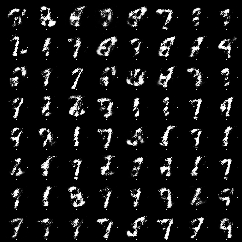



26/50 Sample of generated images


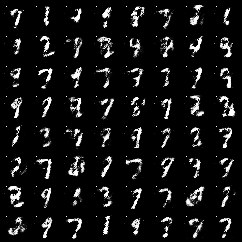



27/50 Sample of generated images


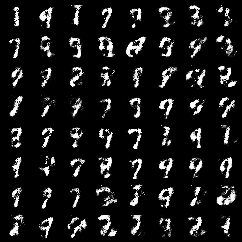



28/50 Sample of generated images


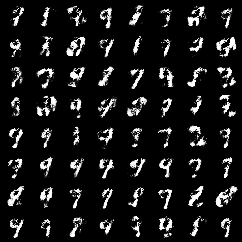



29/50 Sample of generated images


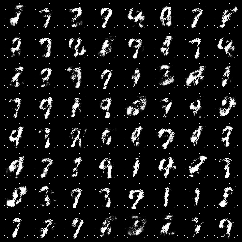



30/50 Sample of generated images


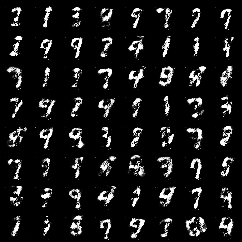



31/50 Sample of generated images


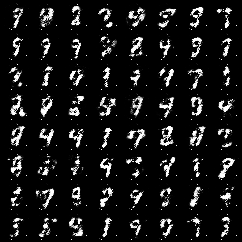



32/50 Sample of generated images


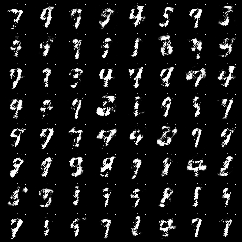



33/50 Sample of generated images


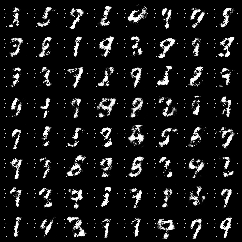



34/50 Sample of generated images


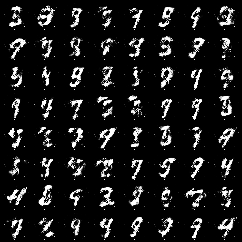



35/50 Sample of generated images


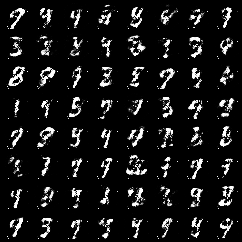



36/50 Sample of generated images


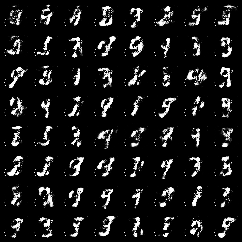



37/50 Sample of generated images


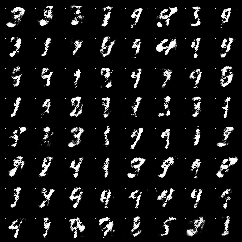



38/50 Sample of generated images


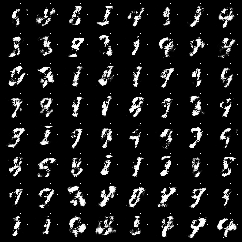



39/50 Sample of generated images


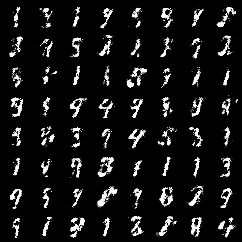



40/50 Sample of generated images


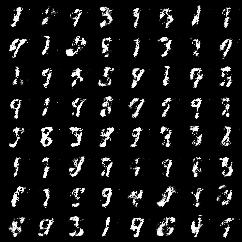



41/50 Sample of generated images


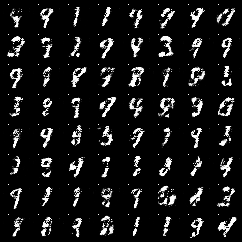



42/50 Sample of generated images


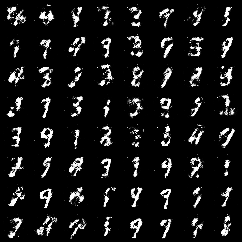



43/50 Sample of generated images


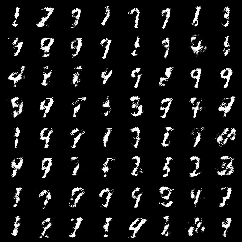



44/50 Sample of generated images


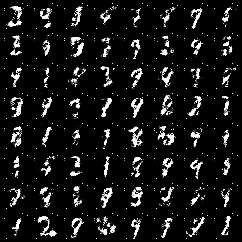



45/50 Sample of generated images


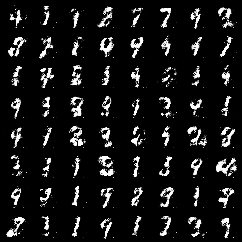



46/50 Sample of generated images


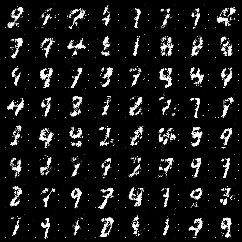



47/50 Sample of generated images


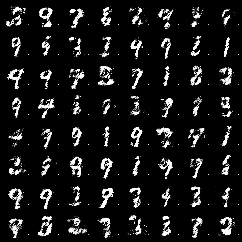



48/50 Sample of generated images


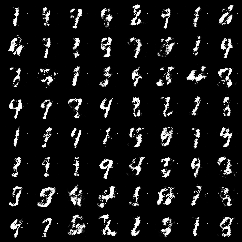



49/50 Sample of generated images


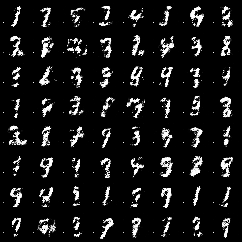



50/50 Sample of generated images


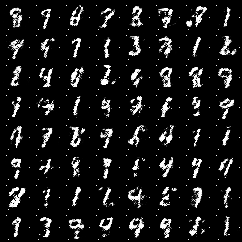

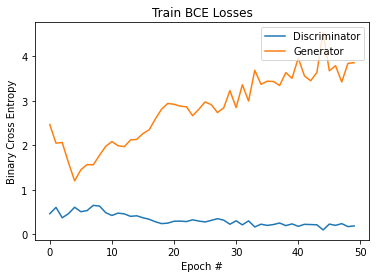

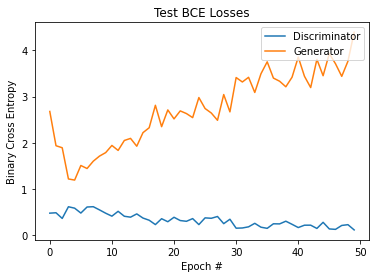

In [ ]:
import torch_optimizer as optset

epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = optset.RAdam(generator_model.parameters(), lr=1e-4)
discriminator_model = Discriminator().to(device)
discriminator_optimizer = optset.RAdam(discriminator_model.parameters(), lr=1e-4)
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        print('%d/%d Sample of generated images' % (epoch, epochs))
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        if epoch == epochs:
            save_image(sample.view(64, 1, 28, 28),
                       'results/final_radam_sample.png')
            display(Image('results/final_radam_sample.png'))
        else:
            save_image(sample.view(64, 1, 28, 28),
                    'results/sample_' + str(epoch) + '.png')
            display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

In [ ]:
from google.colab import files

files.download('./results/final_radam_sample.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Please check your arguments if you have upgraded adabelief-pytorch from version 0.0.5.
Modifications to default arguments:
                           eps  weight_decouple    rectify
-----------------------  -----  -----------------  ---------
adabelief-pytorch=0.0.5  1e-08  False              False
Current version (0.1.0)  1e-16  True               True
For a complete table of recommended hyperparameters, see
https://github.com/juntang-zhuang/Adabelief-Optimizer

Weight decoupling enabled in AdaBelief
Please check your arguments if you have upgraded adabelief-pytorch from version 0.0.5.
Modifications to default arguments:
                           eps  weight_decouple    rectify
-----------------------  -----  -----------------  ---------
adabelief-pytorch=0.0.5  1e-08  False              False
Current version (0.1.0)  1e-16  True               True
For a complete table of recommended hyperparameters, see
https://github.com/juntang-zhuang/Adabelief-Optimizer

Weight decoupling enabled

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Sample of generated images


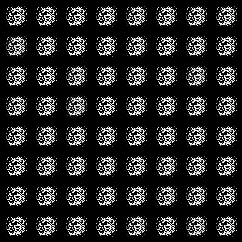



Sample of generated images


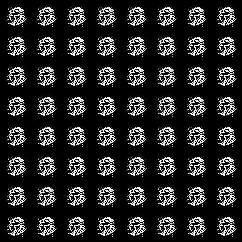



Sample of generated images


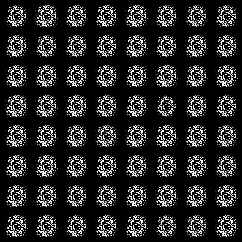



Sample of generated images


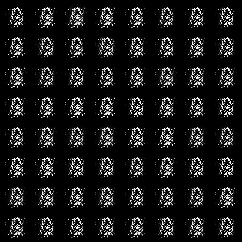



Sample of generated images


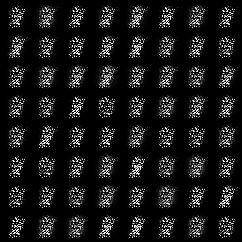



Sample of generated images


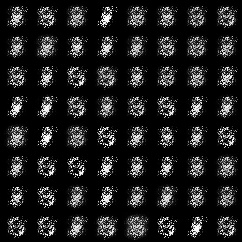



Sample of generated images


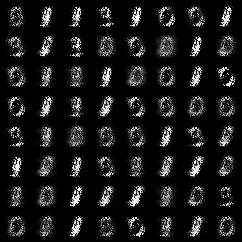



Sample of generated images


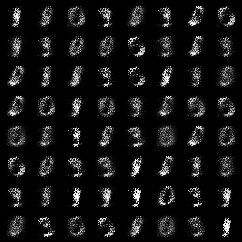



Sample of generated images


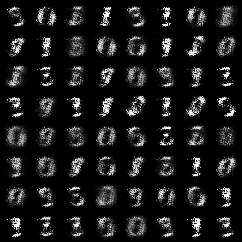



Sample of generated images


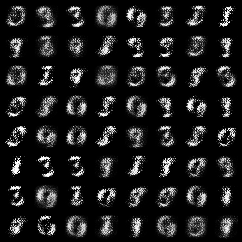



Sample of generated images


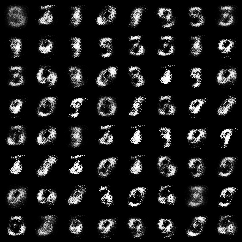



Sample of generated images


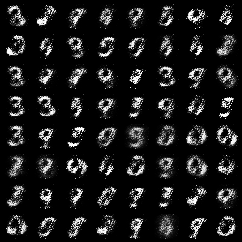



Sample of generated images


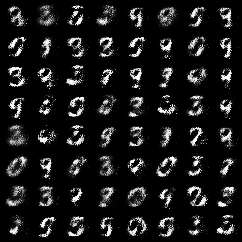



Sample of generated images


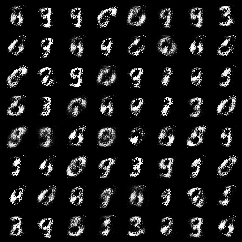



Sample of generated images


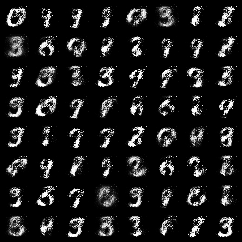



Sample of generated images


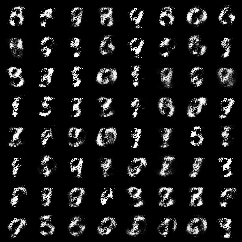



Sample of generated images


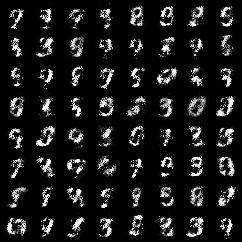



Sample of generated images


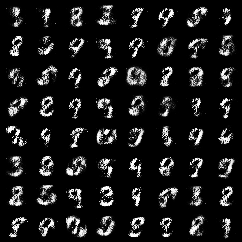



Sample of generated images


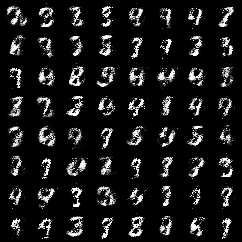



Sample of generated images


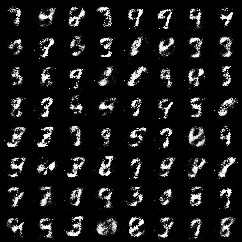



Sample of generated images


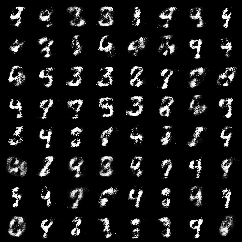



Sample of generated images


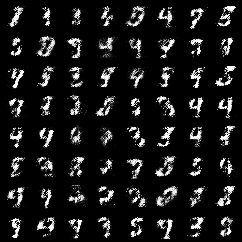



Sample of generated images


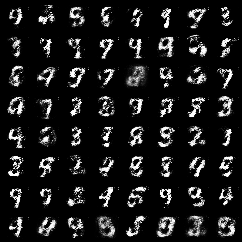



Sample of generated images


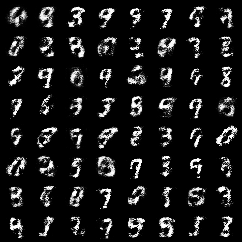



Sample of generated images


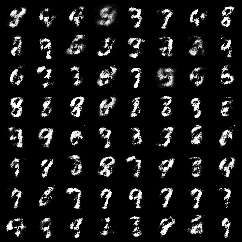



Sample of generated images


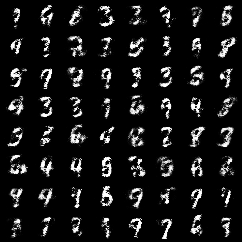



Sample of generated images


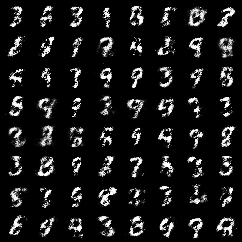



Sample of generated images


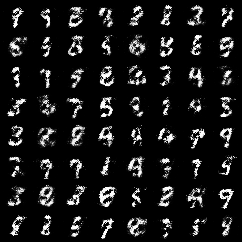



Sample of generated images


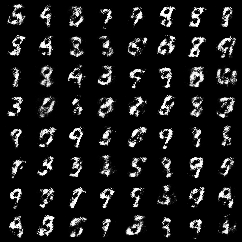



Sample of generated images


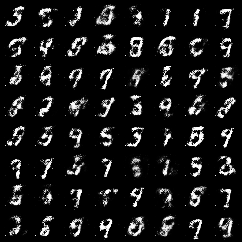



Sample of generated images


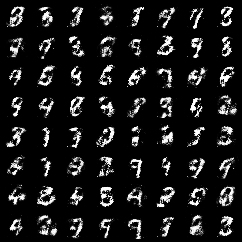



Sample of generated images


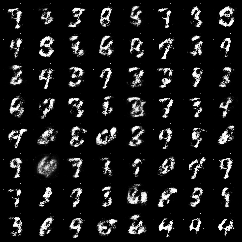



Sample of generated images


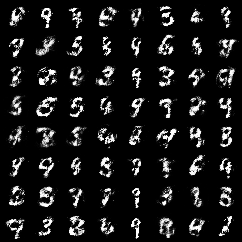



Sample of generated images


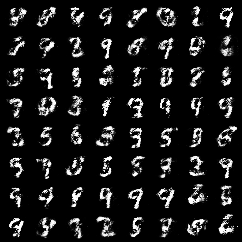



Sample of generated images


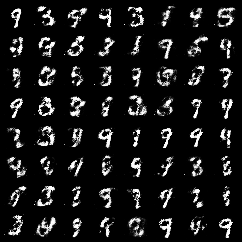



Sample of generated images


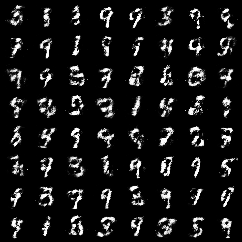



Sample of generated images


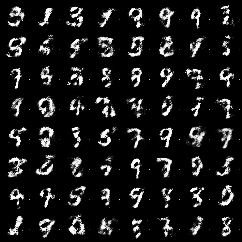



Sample of generated images


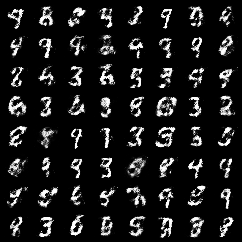



Sample of generated images


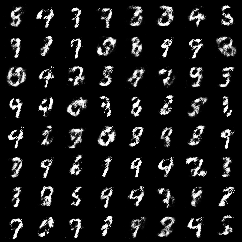



Sample of generated images


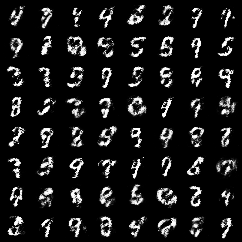



Sample of generated images


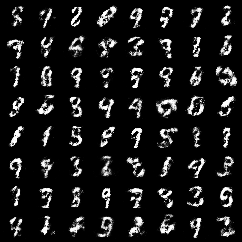



Sample of generated images


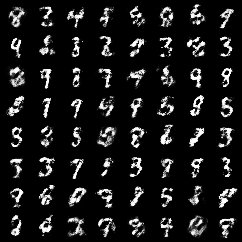



Sample of generated images


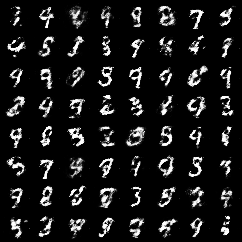



Sample of generated images


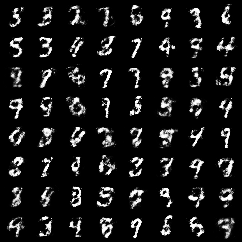



Sample of generated images


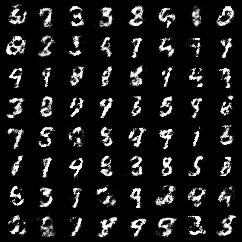



Sample of generated images


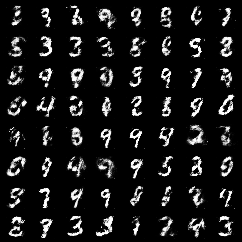



Sample of generated images


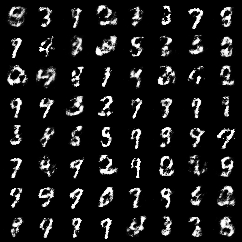



Sample of generated images


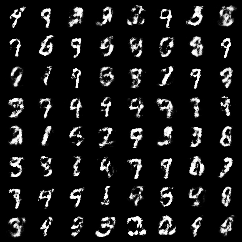



Sample of generated images


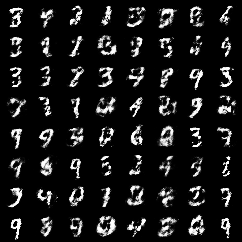



Sample of generated images


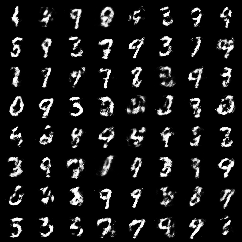

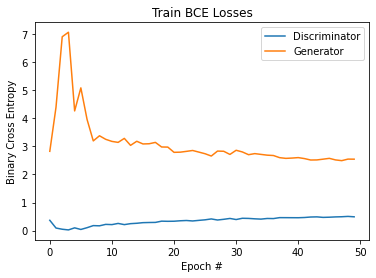

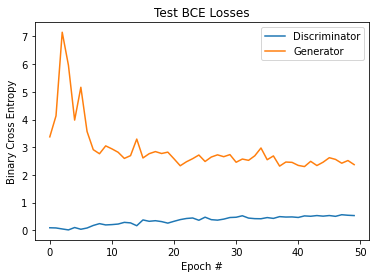

In [ ]:
epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = AdaBelief(generator_model.parameters(), lr=1e-4, rectify=False)
discriminator_model = Discriminator().to(device)
discriminator_optimizer = AdaBelief(discriminator_model.parameters(), lr=1e-4, rectify=False)
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        save_image(sample.view(64, 1, 28, 28),
                   'results/sample_' + str(epoch) + '.png')
        print('Sample of generated images')
        display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Sample of generated images


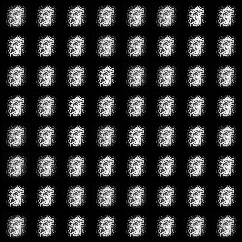



Sample of generated images


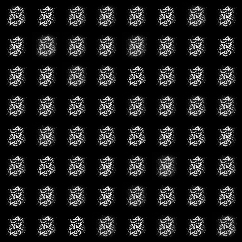



Sample of generated images


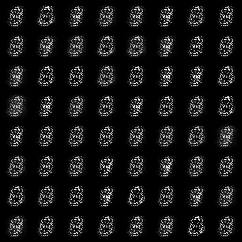



Sample of generated images


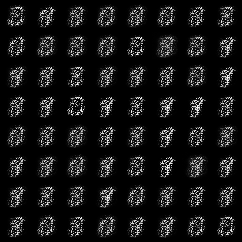



Sample of generated images


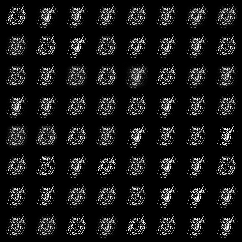



Sample of generated images


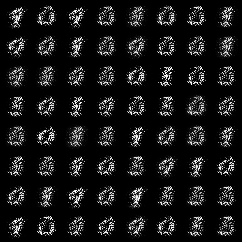



Sample of generated images


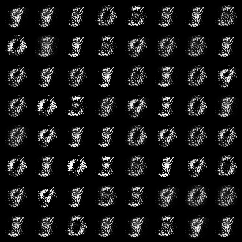



Sample of generated images


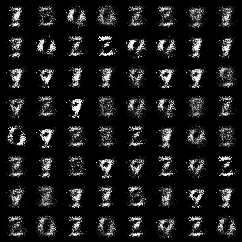



Sample of generated images


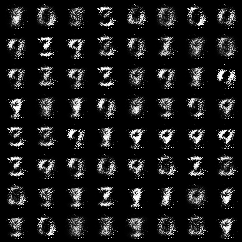



Sample of generated images


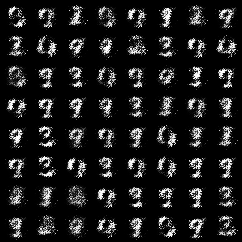



Sample of generated images


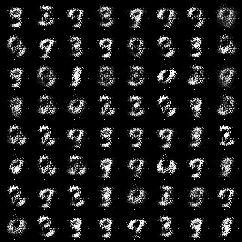



Sample of generated images


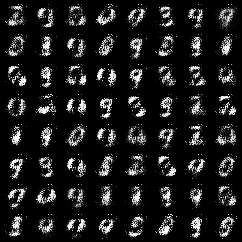



Sample of generated images


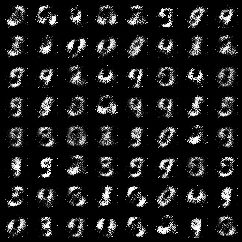



Sample of generated images


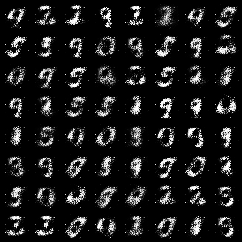



Sample of generated images


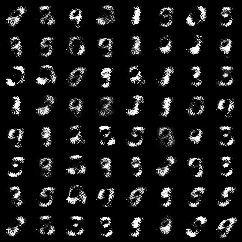



Sample of generated images


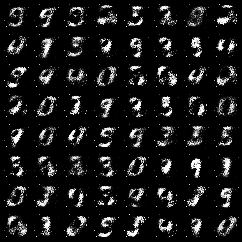



Sample of generated images


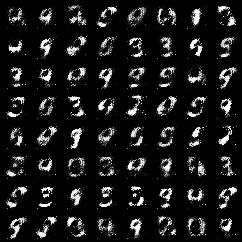



Sample of generated images


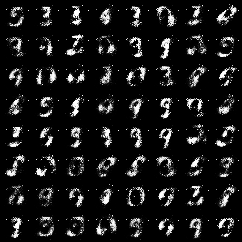



Sample of generated images


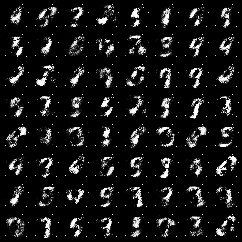



Sample of generated images


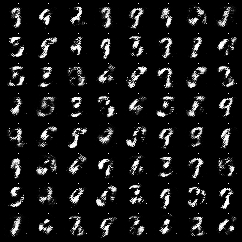



Sample of generated images


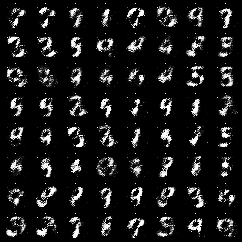



Sample of generated images


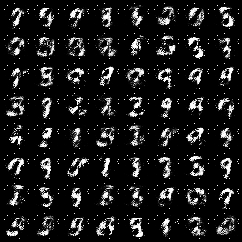



Sample of generated images


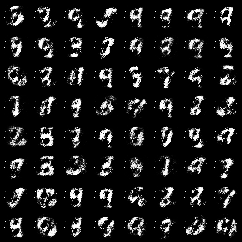



Sample of generated images


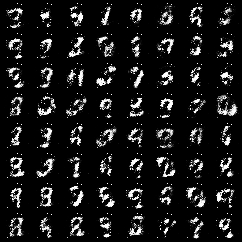



Sample of generated images


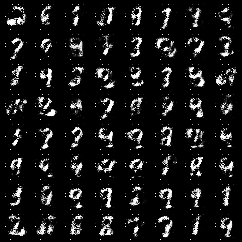



Sample of generated images


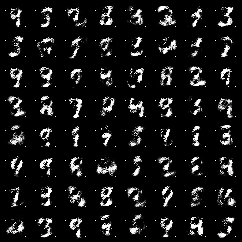



Sample of generated images


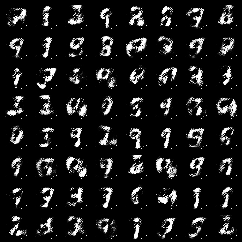



Sample of generated images


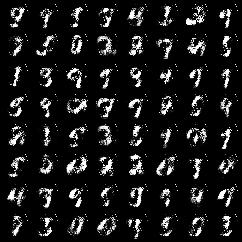



Sample of generated images


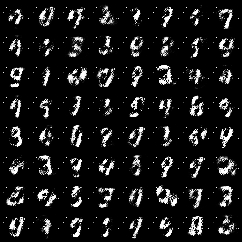



Sample of generated images


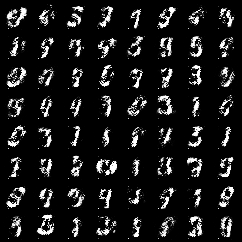



Sample of generated images


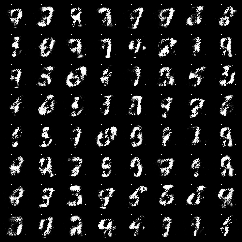



Sample of generated images


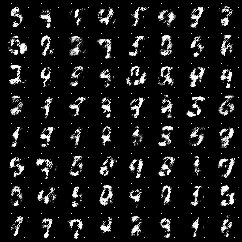



Sample of generated images


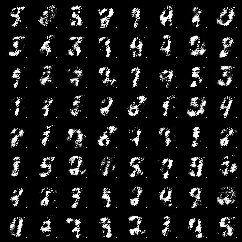



Sample of generated images


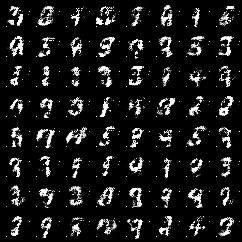



Sample of generated images


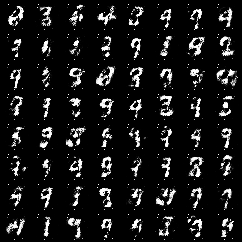



Sample of generated images


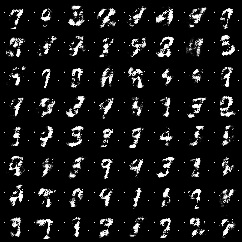



Sample of generated images


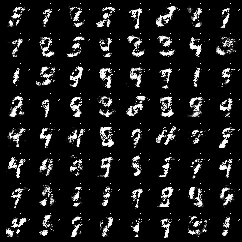



Sample of generated images


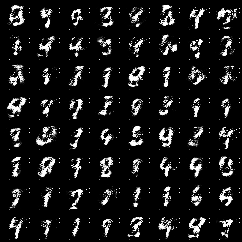



Sample of generated images


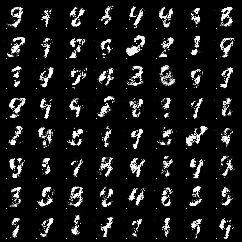



Sample of generated images


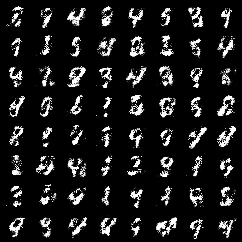



Sample of generated images


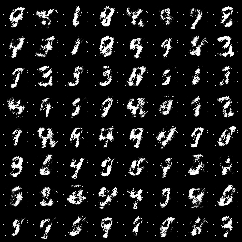



Sample of generated images


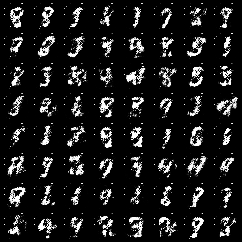



Sample of generated images


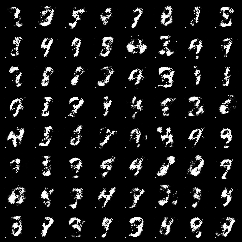



Sample of generated images


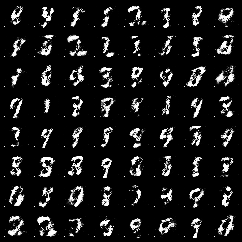



Sample of generated images


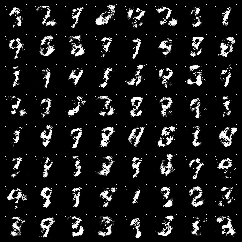



Sample of generated images


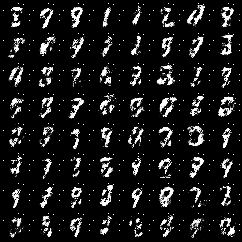



Sample of generated images


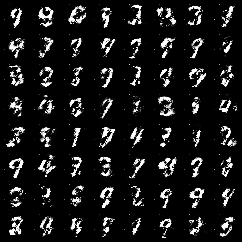



Sample of generated images


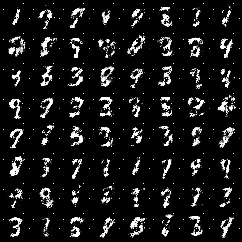



Sample of generated images


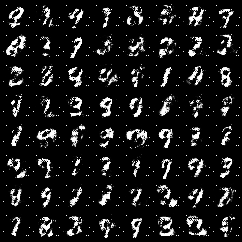



Sample of generated images


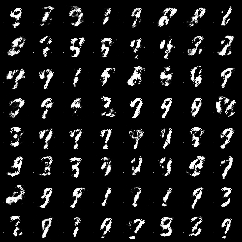

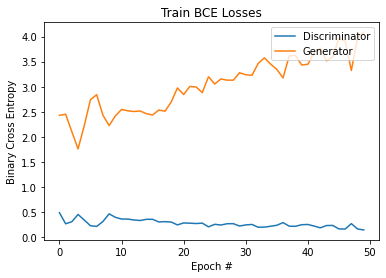

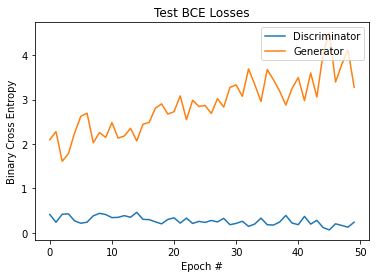

In [ ]:
import torch.optim as optim

epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = optim.Adam(generator_model.parameters(), lr=1e-4)
discriminator_model = Discriminator().to(device)
discriminator_optimizer = optim.Adam(discriminator_model.parameters(), lr=1e-4)
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        save_image(sample.view(64, 1, 28, 28),
                   'results/sample_' + str(epoch) + '.png')
        print('Sample of generated images')
        display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


1/50 Sample of generated images


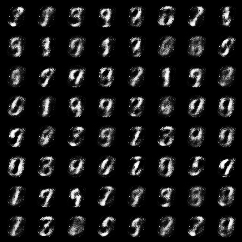



2/50 Sample of generated images


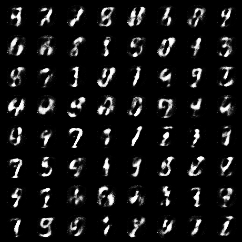



3/50 Sample of generated images


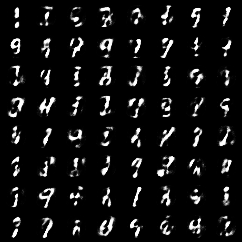



4/50 Sample of generated images


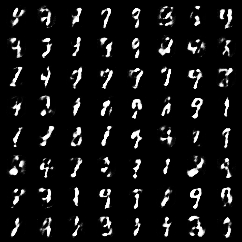



5/50 Sample of generated images


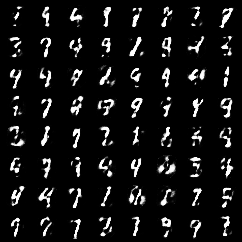



6/50 Sample of generated images


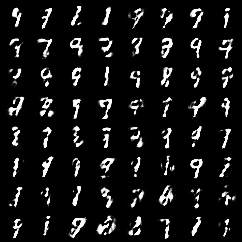



7/50 Sample of generated images


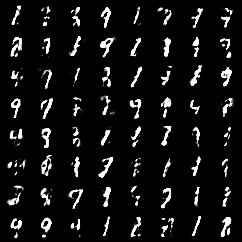



8/50 Sample of generated images


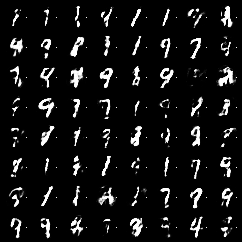



9/50 Sample of generated images


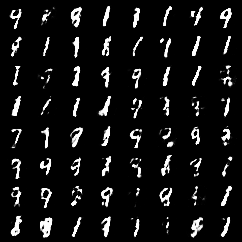



10/50 Sample of generated images


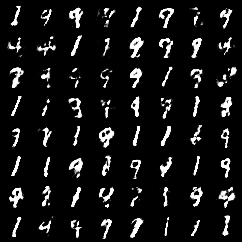



11/50 Sample of generated images


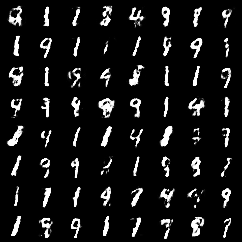



12/50 Sample of generated images


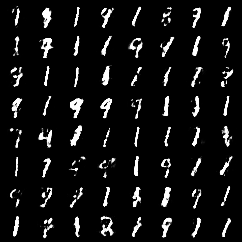



13/50 Sample of generated images


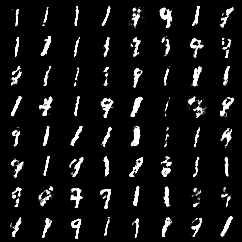



14/50 Sample of generated images


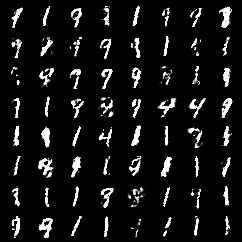



15/50 Sample of generated images


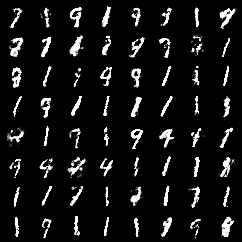



16/50 Sample of generated images


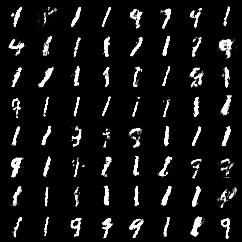



17/50 Sample of generated images


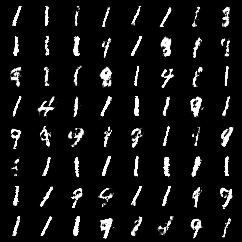



18/50 Sample of generated images


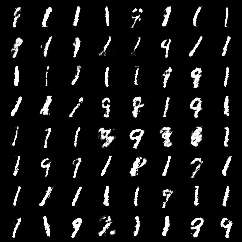



19/50 Sample of generated images


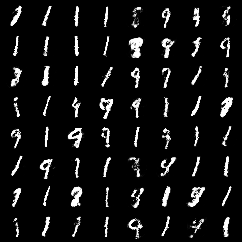



20/50 Sample of generated images


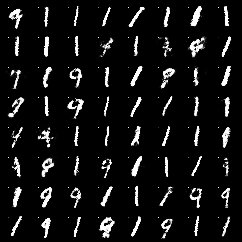



21/50 Sample of generated images


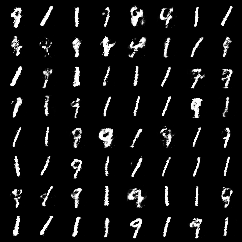



22/50 Sample of generated images


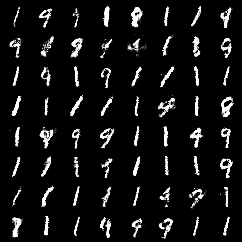



23/50 Sample of generated images


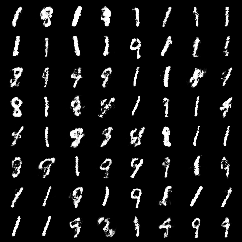



24/50 Sample of generated images


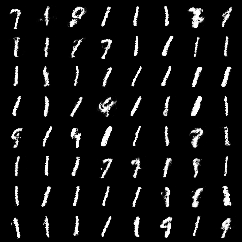



25/50 Sample of generated images


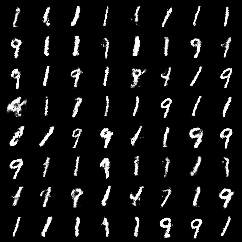



26/50 Sample of generated images


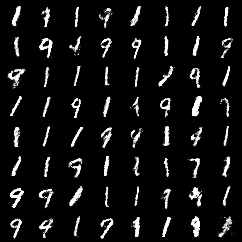



27/50 Sample of generated images


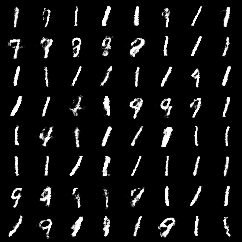



28/50 Sample of generated images


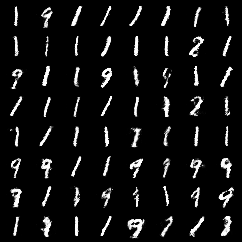



29/50 Sample of generated images


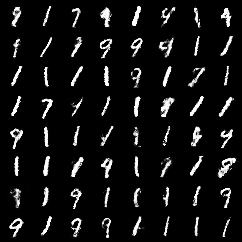



30/50 Sample of generated images


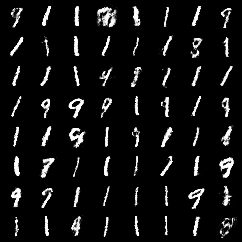



31/50 Sample of generated images


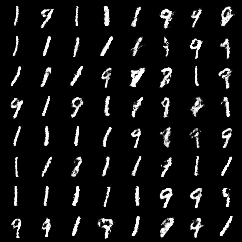



32/50 Sample of generated images


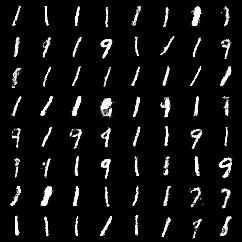



33/50 Sample of generated images


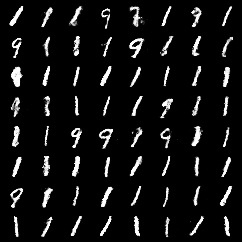



34/50 Sample of generated images


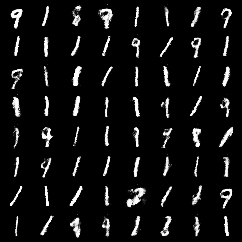



35/50 Sample of generated images


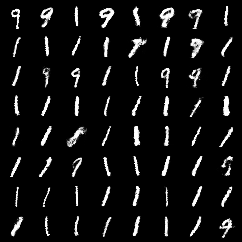



36/50 Sample of generated images


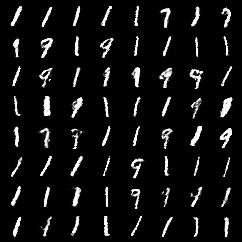



37/50 Sample of generated images


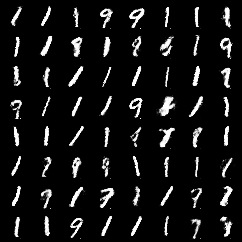



38/50 Sample of generated images


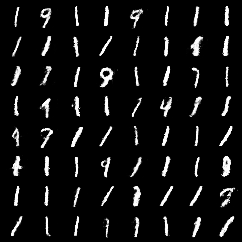



39/50 Sample of generated images


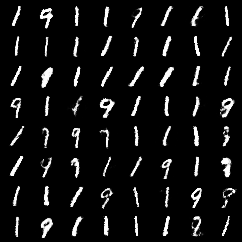



40/50 Sample of generated images


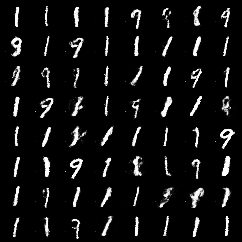



41/50 Sample of generated images


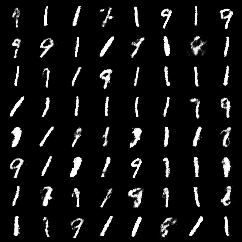



42/50 Sample of generated images


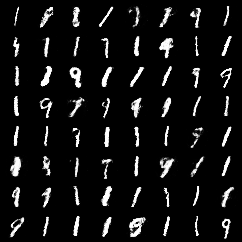



43/50 Sample of generated images


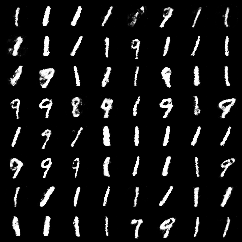



44/50 Sample of generated images


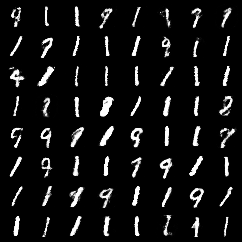



45/50 Sample of generated images


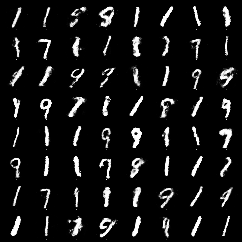



46/50 Sample of generated images


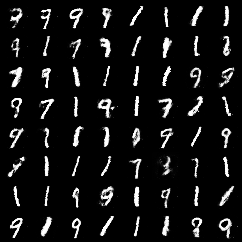



47/50 Sample of generated images


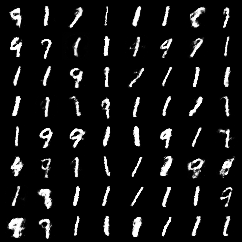



48/50 Sample of generated images


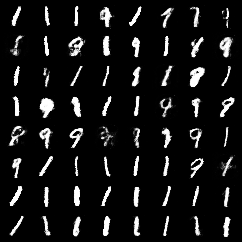



49/50 Sample of generated images


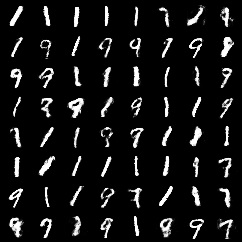



50/50 Sample of generated images


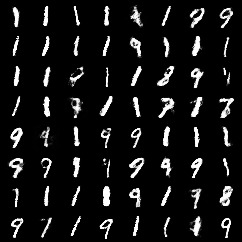

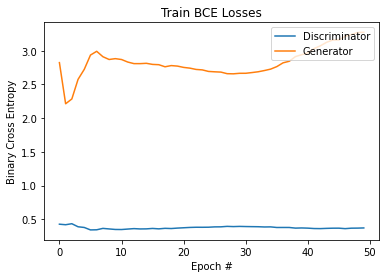

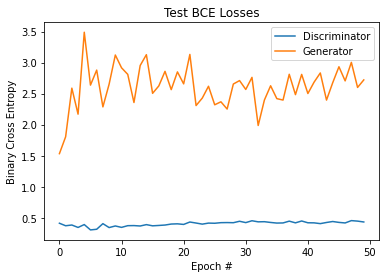

In [ ]:
import torch.optim as optim

epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = optim.SGD(generator_model.parameters(), lr=1e-3)
discriminator_model = Discriminator().to(device)
discriminator_optimizer = optim.SGD(discriminator_model.parameters(), lr=1e-3)
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        print('%d/%d Sample of generated images' % (epoch, epochs))
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        if epoch == epochs:
            save_image(sample.view(64, 1, 28, 28),
                       'results/final_sgd_sample.png')
            display(Image('results/final_sgd_sample.png'))
        else:
            save_image(sample.view(64, 1, 28, 28),
                    'results/sample_' + str(epoch) + '.png')
            display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

torch.save(discriminator_average_train_losses, 'sgd_gan_d_large_lr_train.pt')
torch.save(generator_average_train_losses, 'sgd_gan_g_large_lr_train.pt')
torch.save(discriminator_average_test_losses, 'sgd_gan_d_large_lr_test.pt')
torch.save(generator_average_test_losses, 'sgd_gan_g_large_lr_test.pt')

In [ ]:
from google.colab import files

path_list = ['sgd_gan_d_large_lr_train.pt',
             'sgd_gan_g_large_lr_train.pt',
             'sgd_gan_d_large_lr_test.pt',
             'sgd_gan_g_large_lr_test.pt',
             'results/final_sgd_sample.png']
for path in path_list:
    files.download(path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


1/50 Sample of generated images


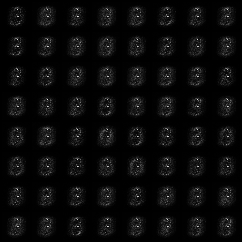



2/50 Sample of generated images


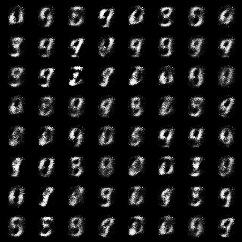



3/50 Sample of generated images


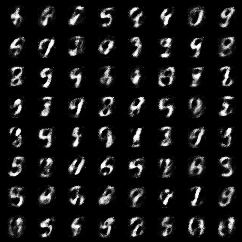



4/50 Sample of generated images


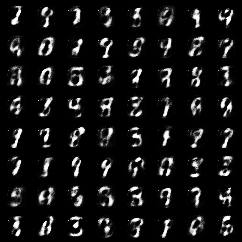



5/50 Sample of generated images


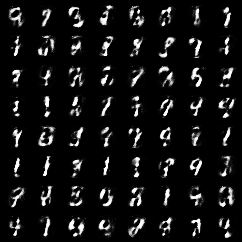



6/50 Sample of generated images


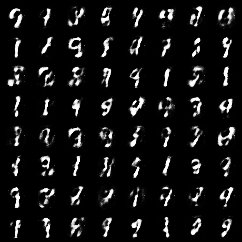



7/50 Sample of generated images


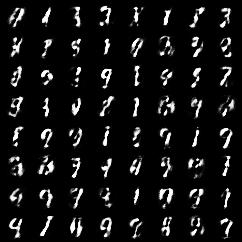



8/50 Sample of generated images


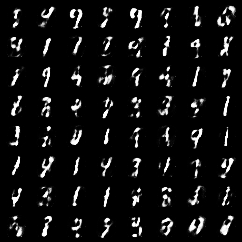



9/50 Sample of generated images


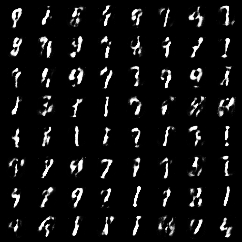



10/50 Sample of generated images


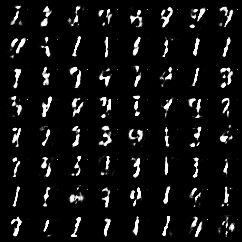



11/50 Sample of generated images


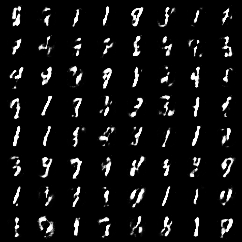



12/50 Sample of generated images


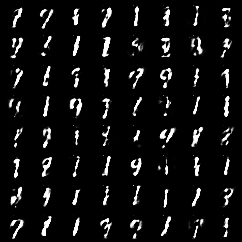



13/50 Sample of generated images


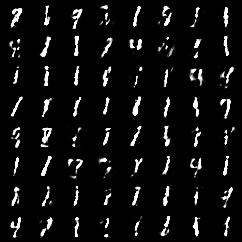



14/50 Sample of generated images


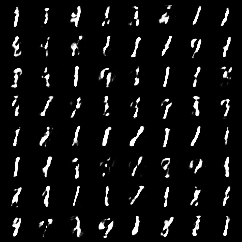



15/50 Sample of generated images


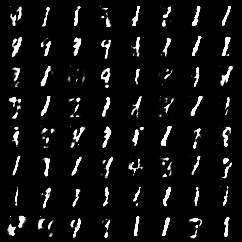



16/50 Sample of generated images


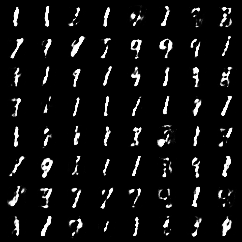



17/50 Sample of generated images


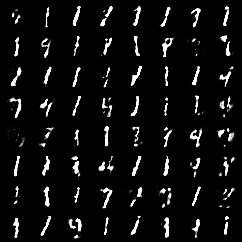



18/50 Sample of generated images


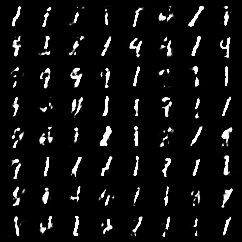



19/50 Sample of generated images


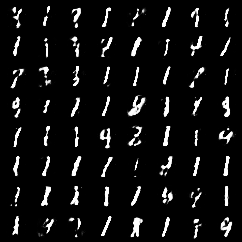



20/50 Sample of generated images


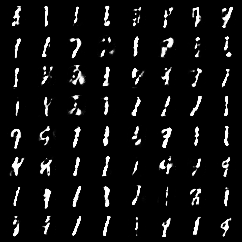



21/50 Sample of generated images


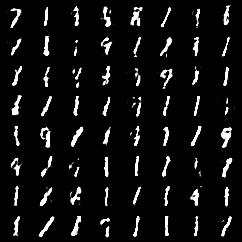



22/50 Sample of generated images


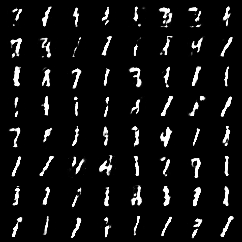



23/50 Sample of generated images


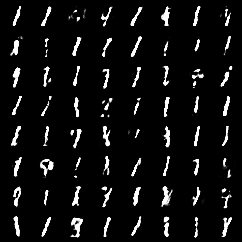



24/50 Sample of generated images


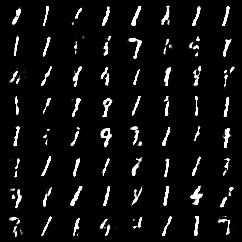



25/50 Sample of generated images


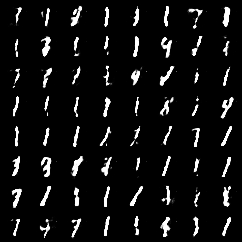



26/50 Sample of generated images


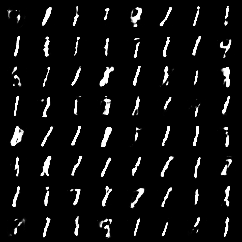



27/50 Sample of generated images


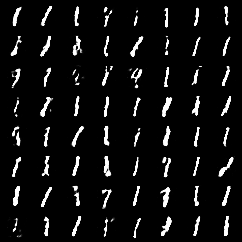



28/50 Sample of generated images


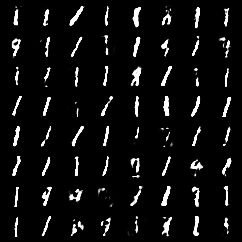



29/50 Sample of generated images


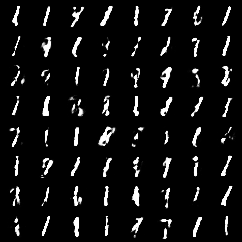



30/50 Sample of generated images


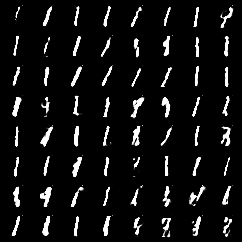



31/50 Sample of generated images


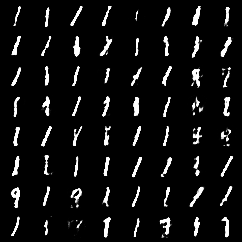



32/50 Sample of generated images


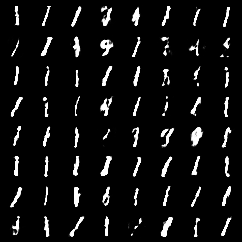



33/50 Sample of generated images


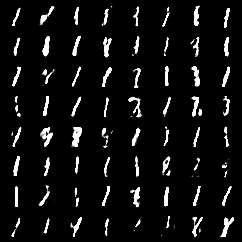



34/50 Sample of generated images


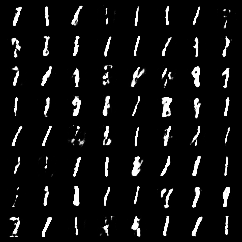



35/50 Sample of generated images


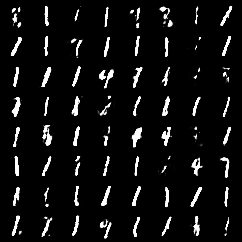



36/50 Sample of generated images


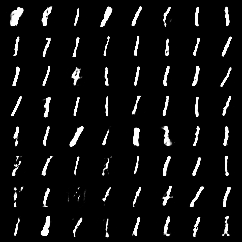



37/50 Sample of generated images


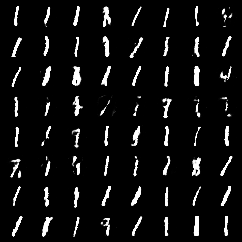



38/50 Sample of generated images


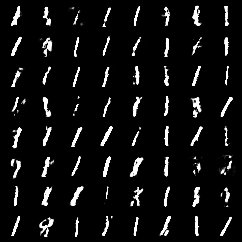



39/50 Sample of generated images


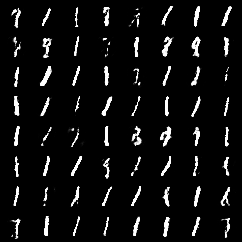



40/50 Sample of generated images


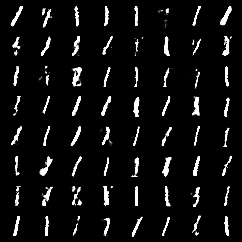



41/50 Sample of generated images


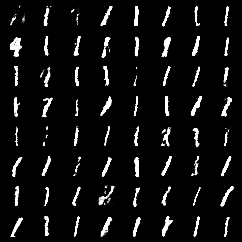



42/50 Sample of generated images


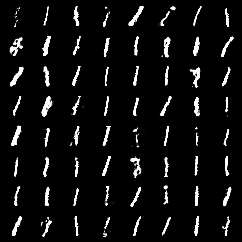



43/50 Sample of generated images


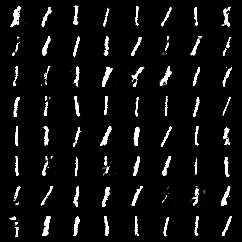



44/50 Sample of generated images


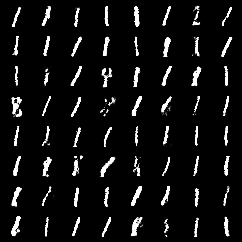



45/50 Sample of generated images


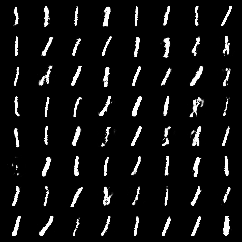



46/50 Sample of generated images


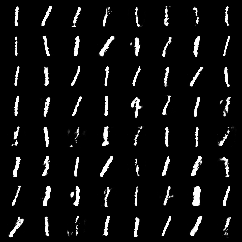



47/50 Sample of generated images


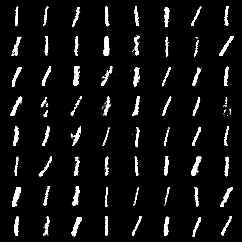



48/50 Sample of generated images


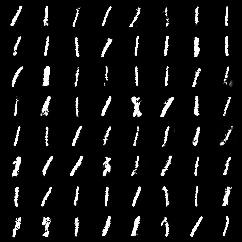



49/50 Sample of generated images


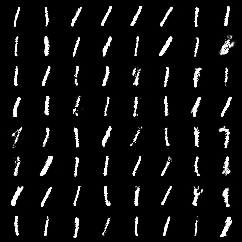



50/50 Sample of generated images


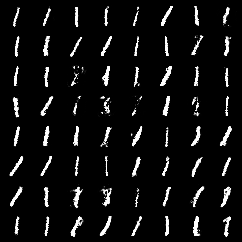

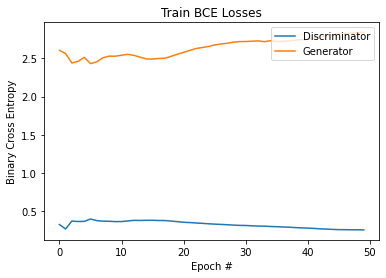

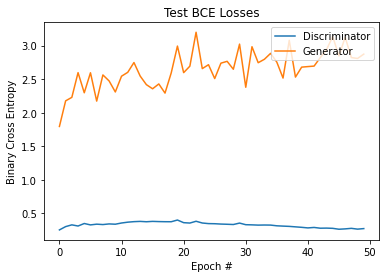

In [ ]:
import torch.optim as optim

epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = optim.SGD(generator_model.parameters(), lr=3e-4)
discriminator_model = Discriminator().to(device)
discriminator_optimizer = optim.SGD(discriminator_model.parameters(), lr=3e-4)
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        print('%d/%d Sample of generated images' % (epoch, epochs))
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        if epoch == epochs:
            save_image(sample.view(64, 1, 28, 28),
                       'results/final_sgd_sample.png')
            display(Image('results/final_sgd_sample.png'))
        else:
            save_image(sample.view(64, 1, 28, 28),
                    'results/sample_' + str(epoch) + '.png')
            display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

torch.save(discriminator_average_train_losses, 'sgd_gan_d_medium_lr_train.pt')
torch.save(generator_average_train_losses, 'sgd_gan_g_medium_lr_train.pt')
torch.save(discriminator_average_test_losses, 'sgd_gan_d_medium_lr_test.pt')
torch.save(generator_average_test_losses, 'sgd_gan_g_medium_lr_test.pt')

In [ ]:
path_list = ['sgd_gan_g_medium_lr_train.pt',
             'sgd_gan_g_medium_lr_test.pt',
             'results/final_sgd_sample.png']
for path in path_list:
    files.download(path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


1/50 Sample of generated images


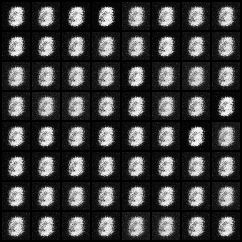



2/50 Sample of generated images


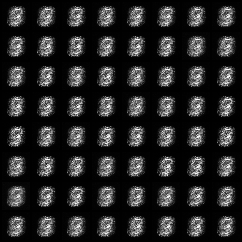



3/50 Sample of generated images


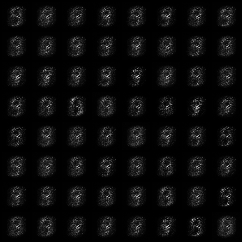



4/50 Sample of generated images


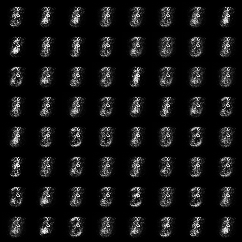



5/50 Sample of generated images


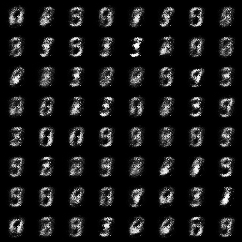



6/50 Sample of generated images


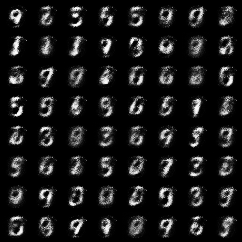



7/50 Sample of generated images


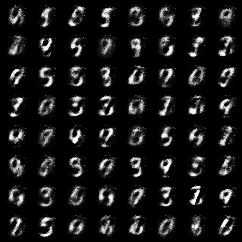



8/50 Sample of generated images


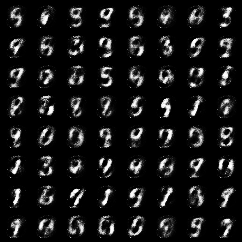



9/50 Sample of generated images


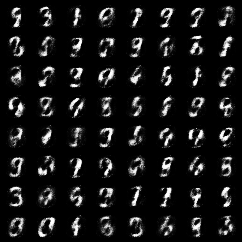



10/50 Sample of generated images


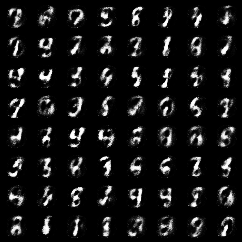



11/50 Sample of generated images


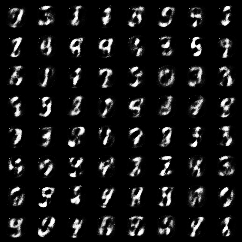



12/50 Sample of generated images


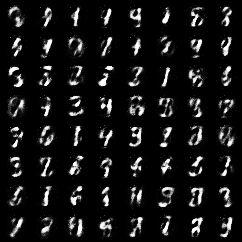



13/50 Sample of generated images


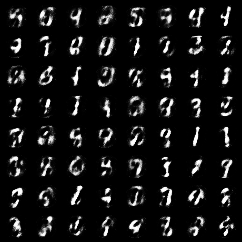



14/50 Sample of generated images


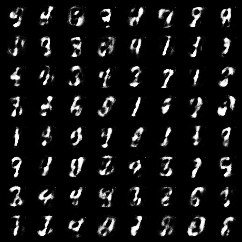



15/50 Sample of generated images


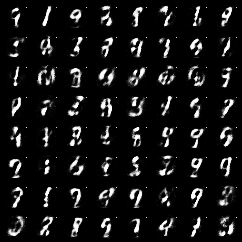



16/50 Sample of generated images


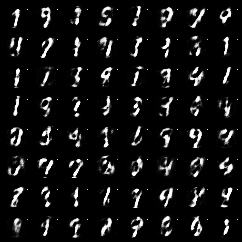



17/50 Sample of generated images


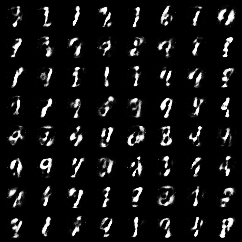



18/50 Sample of generated images


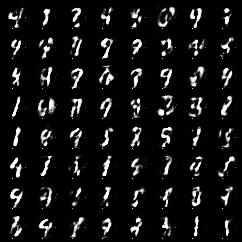



19/50 Sample of generated images


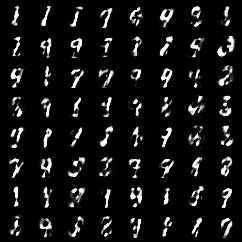



20/50 Sample of generated images


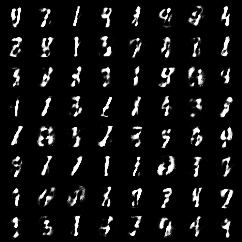



21/50 Sample of generated images


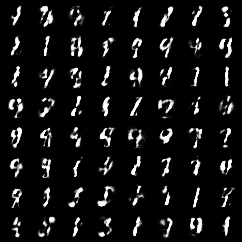



22/50 Sample of generated images


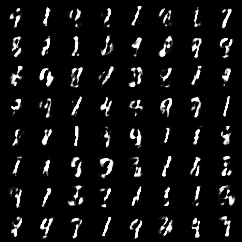



23/50 Sample of generated images


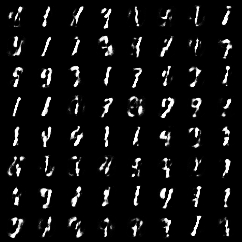



24/50 Sample of generated images


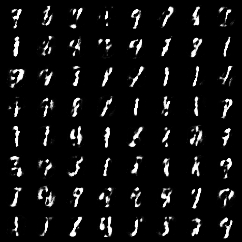



25/50 Sample of generated images


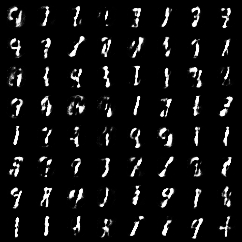



26/50 Sample of generated images


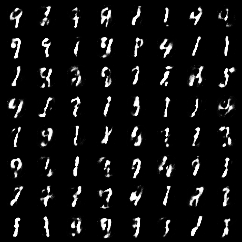



27/50 Sample of generated images


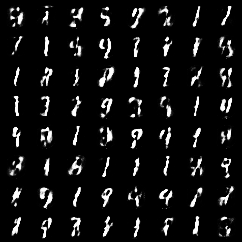



28/50 Sample of generated images


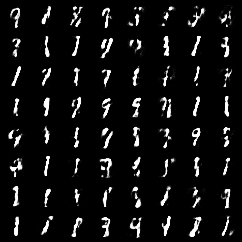



29/50 Sample of generated images


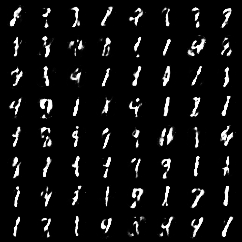



30/50 Sample of generated images


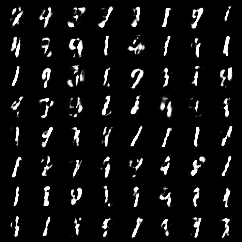



31/50 Sample of generated images


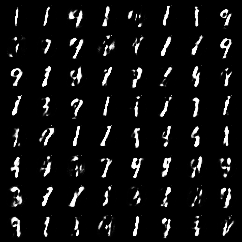



32/50 Sample of generated images


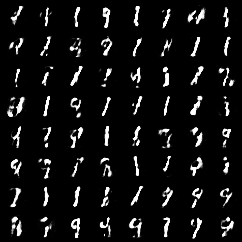



33/50 Sample of generated images


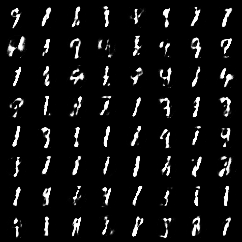



34/50 Sample of generated images


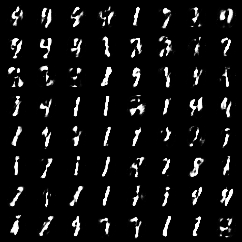



35/50 Sample of generated images


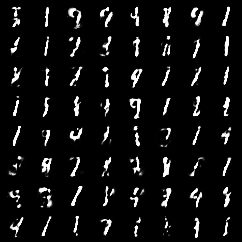



36/50 Sample of generated images


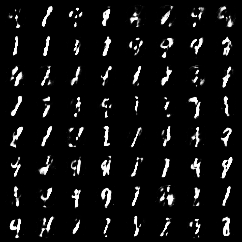



37/50 Sample of generated images


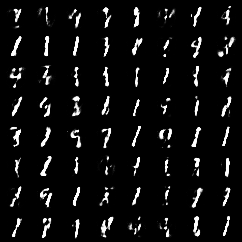



38/50 Sample of generated images


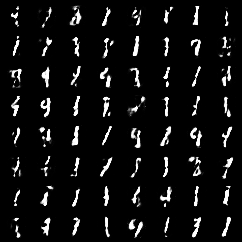



39/50 Sample of generated images


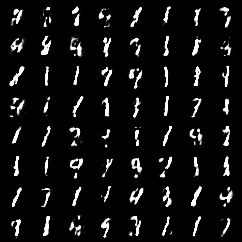



40/50 Sample of generated images


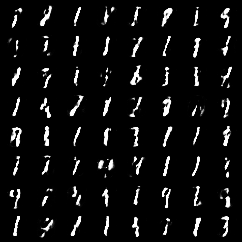



41/50 Sample of generated images


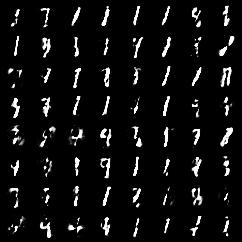



42/50 Sample of generated images


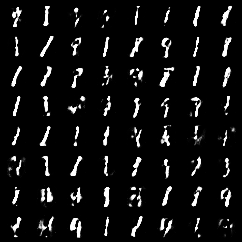



43/50 Sample of generated images


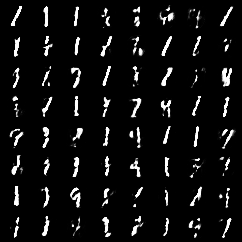



44/50 Sample of generated images


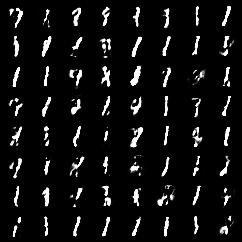



45/50 Sample of generated images


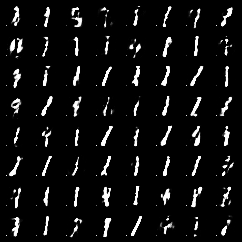



46/50 Sample of generated images


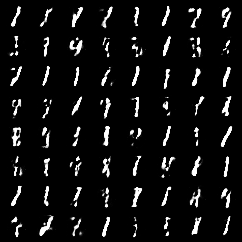



47/50 Sample of generated images


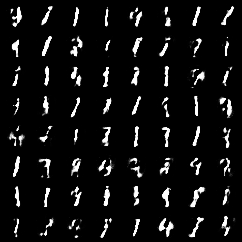



48/50 Sample of generated images


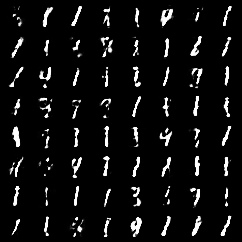



49/50 Sample of generated images


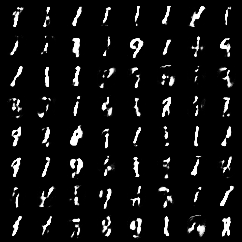



50/50 Sample of generated images


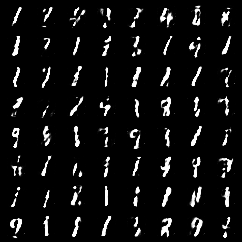

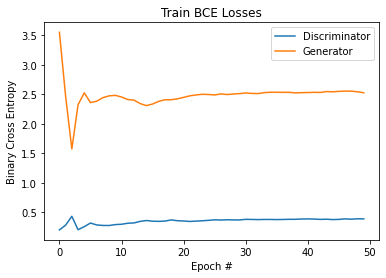

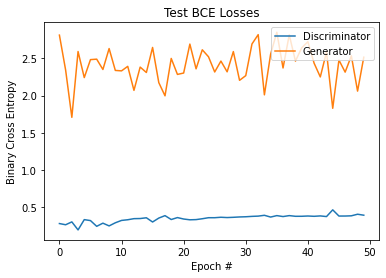

In [ ]:
import torch.optim as optim

epochs = 50
discriminator_average_train_losses = []
discriminator_average_test_losses = []
generator_average_train_losses = []
generator_average_test_losses = []
generator_model = Generator().to(device)
generator_optimizer = optim.SGD(generator_model.parameters(), lr=1e-4)
discriminator_model = Discriminator().to(device)
discriminator_optimizer = optim.SGD(discriminator_model.parameters(), lr=1e-4)
for epoch in range(1, epochs + 1):
    generator_average_train_loss, discriminator_average_train_loss = gan_train(epoch, generator_model, generator_optimizer, discriminator_model, discriminator_optimizer)
    discriminator_average_train_losses.append(discriminator_average_train_loss)
    generator_average_train_losses.append(generator_average_train_loss)
    generator_average_test_loss, discriminator_average_test_loss = gan_test(epoch, generator_model, discriminator_model)
    discriminator_average_test_losses.append(discriminator_average_test_loss)
    generator_average_test_losses.append(generator_average_test_loss)
    with torch.no_grad():
        print('%d/%d Sample of generated images' % (epoch, epochs))
        sample = torch.randn(64, 20).to(device)
        sample = generator_model(sample).cpu()
        if epoch == epochs:
            save_image(sample.view(64, 1, 28, 28),
                       'results/final_sgd_sample.png')
            display(Image('results/final_sgd_sample.png'))
        else:
            save_image(sample.view(64, 1, 28, 28),
                    'results/sample_' + str(epoch) + '.png')
            display(Image('results/sample_' + str(epoch) + '.png'))
        print('\n')

# Plot Train losses
plt.plot(discriminator_average_train_losses)
plt.plot(generator_average_train_losses)
plt.title('Train BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

# Plot Test Losses
plt.plot(discriminator_average_test_losses)
plt.plot(generator_average_test_losses)
plt.title('Test BCE Losses')
plt.ylabel('Binary Cross Entropy')
plt.xlabel('Epoch #')
plt.legend(['Discriminator','Generator'], loc='upper right')
plt.show()

torch.save(discriminator_average_train_losses, 'sgd_gan_d_small_lr_train.pt')
torch.save(generator_average_train_losses, 'sgd_gan_g_small_lr_train.pt')
torch.save(discriminator_average_test_losses, 'sgd_gan_d_small_lr_test.pt')
torch.save(generator_average_test_losses, 'sgd_gan_g_small_lr_test.pt')

In [ ]:
path_list = ['sgd_gan_g_small_lr_train.pt',
             'sgd_gan_g_small_lr_test.pt',
             'results/final_sgd_sample.png']
for path in path_list:
    files.download(path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>